In [1]:
using CSV
using DataFrames
using Plots

# ファイル読み込み

In [3]:
# const FILE_NAME = "../output/CircleModel_20240626_100225.csv"
# const FILE_NAME = "../output/CircleModel_20240626_161201.csv"  # 乱数シードを修正
const FILE_NAME = "../output/CircleModel_20240701_141220.csv"  # 平均次数が一定になるように修正
df = CSV.File(FILE_NAME) |> DataFrame
replace!(df.ev_hop, -1 => 99)  # -1は無限大の変動を表している。ソートの都合で99に置換する。
size(df)

(1080, 15)

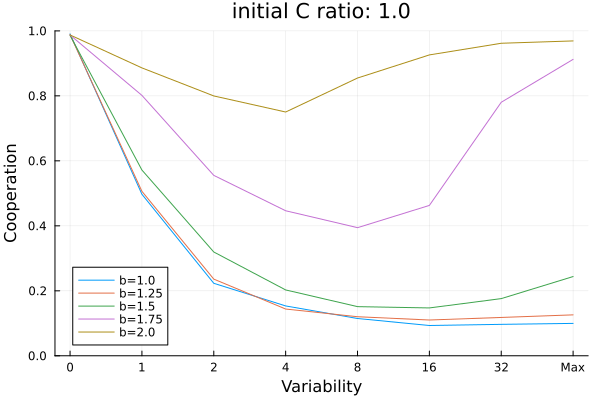

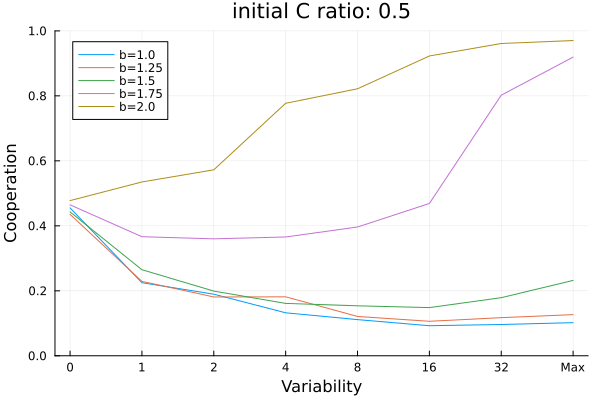

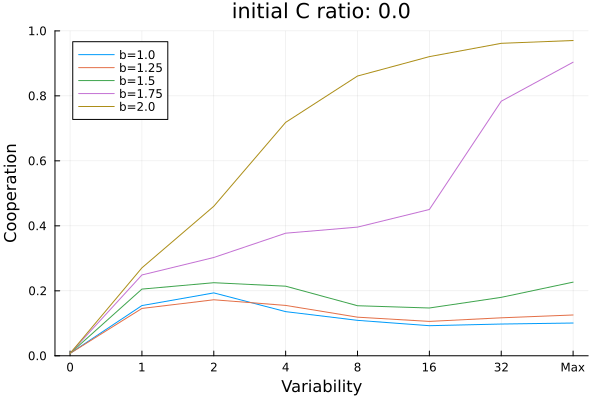

In [4]:
_df = df[
    df.relationship_increment_factor .== 1.0 .&& 
    df.resource_decrement_factor .== 0.9, :]

for __df in groupby(_df, [:C_rate₀])
    title = "initial C ratio: $(__df.C_rate₀[1])"
    ev_hop_vec = [x == 99 ? "Max" : string(x) for x in sort(unique(__df.ev_hop))]
    
    p = plot(
        xticks=(1:length(ev_hop_vec), ev_hop_vec),
        ylim=(0,1),
        xlabel="Variability",
        ylabel="Cooperation",
        title=title,
    )

    for ___df in groupby(__df, [:b])
        b = ___df.b[1]
        ___df = sort(___df[:, [:ev_hop, :cooperation_rate]])
        plot!(___df.cooperation_rate, label="b=$(b)")
    end

    display(p)
end

# 大区分: b, relationship_increment_factor, resource_decrement_factor, 小区分: C_rate₀

b=1.0


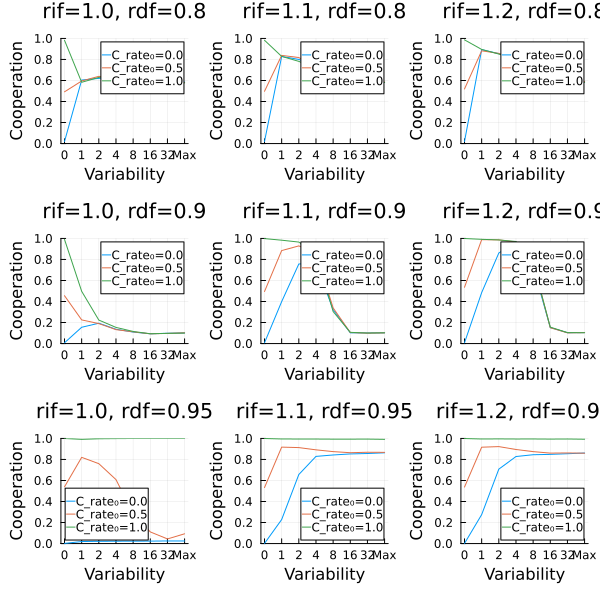

b=1.25


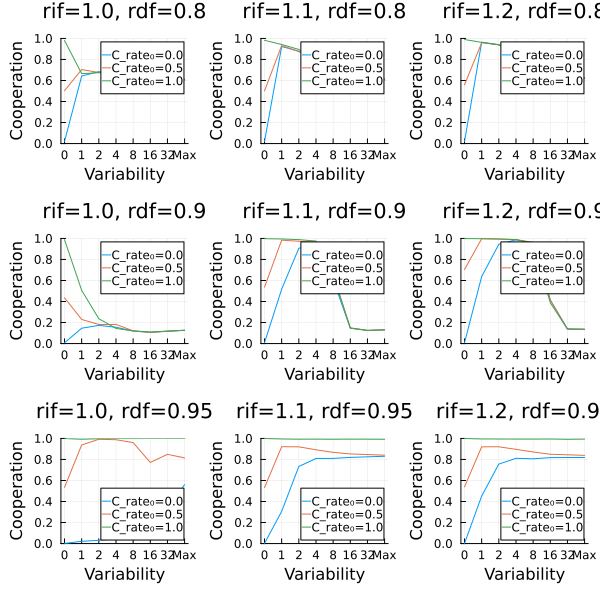

b=1.5


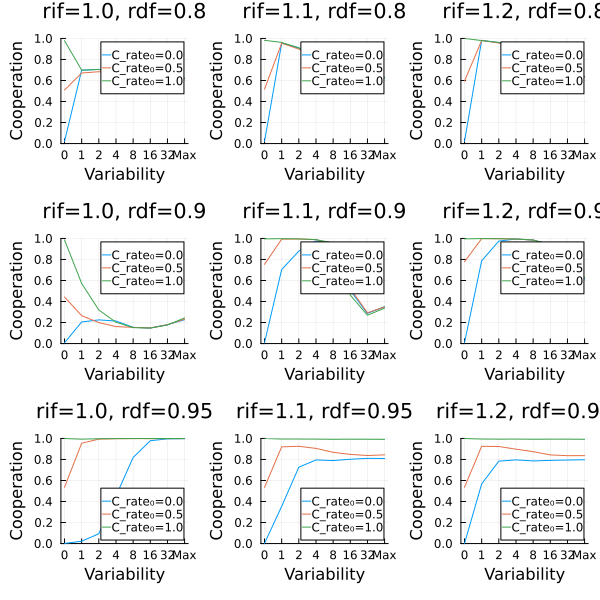

b=1.75


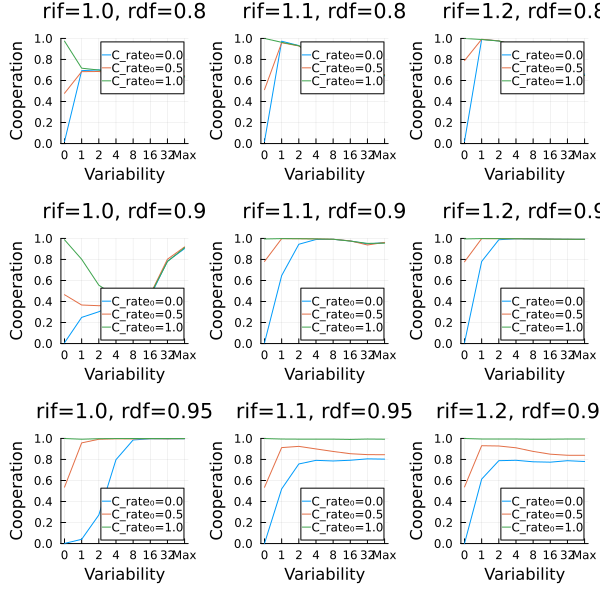

b=2.0


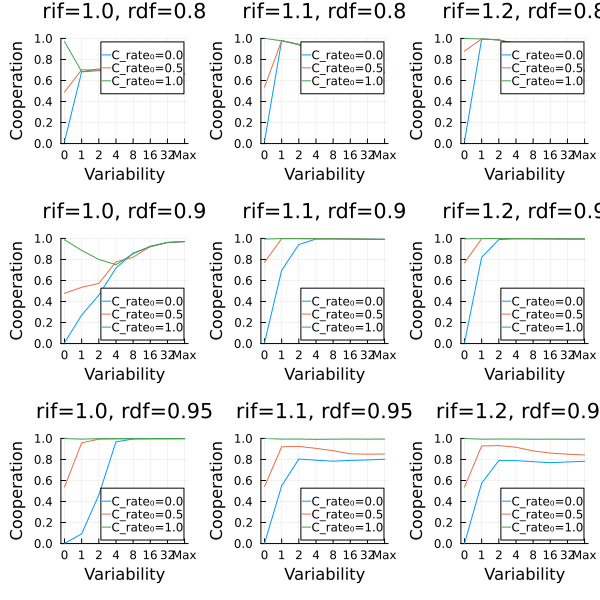

In [6]:
for b in sort(unique(df.b))
    println("b=$(b)")
    p_vec = []

    for _df in groupby(df[df.b .== b, :], [:relationship_increment_factor, :resource_decrement_factor])
        _sr = _df[1, :]
        title = "rif=$(_sr.relationship_increment_factor), rdf=$(_sr.resource_decrement_factor)"
        _df = sort(_df[:, [:C_rate₀, :ev_hop, :cooperation_rate]])

        # x軸: ev_hop
        ev_hop_vec = [x == 99 ? "Max" : string(x) for x in sort(unique(_df.ev_hop))]

        p = plot(
            xticks=(1:length(ev_hop_vec), ev_hop_vec),
            ylim=(0,1),
            xlabel="Variability",
            ylabel="Cooperation",
            title=title,
        )

        for __df in groupby(_df, [:C_rate₀])
            C_rate₀ = __df.C_rate₀[1]
            __df = sort(__df[:, [:ev_hop, :cooperation_rate]])
            plot!(__df.cooperation_rate, label="C_rate₀=$(C_rate₀)")
        end

        push!(p_vec, p)
    end

    plot(p_vec..., layout=(3, 3), size=(600, 600)) |> display
end;

# 大区分: C_rate₀, 中区分: (relationship_increment_factor, resource_decrement_factor), 小区分: b

C_rate₀=0.0


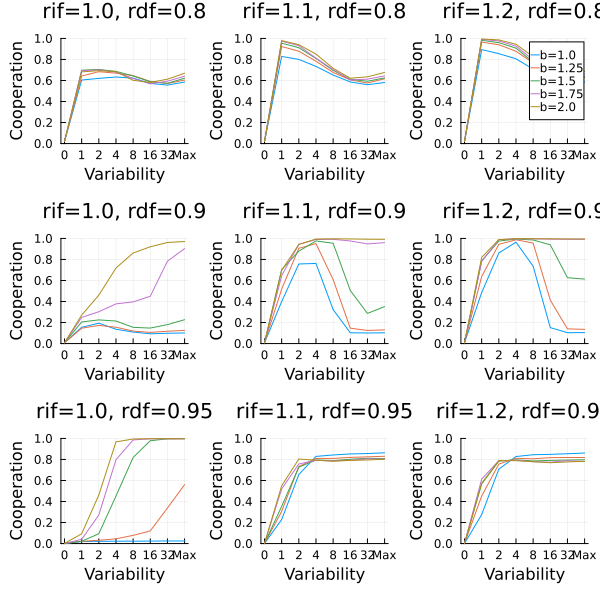

C_rate₀=0.5


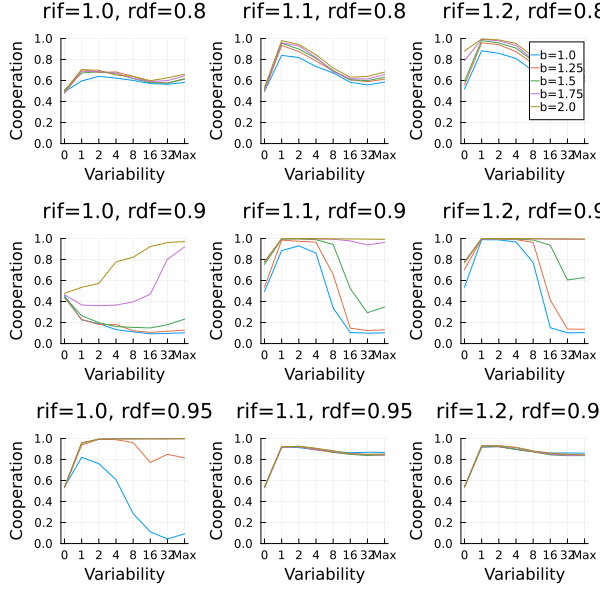

C_rate₀=1.0


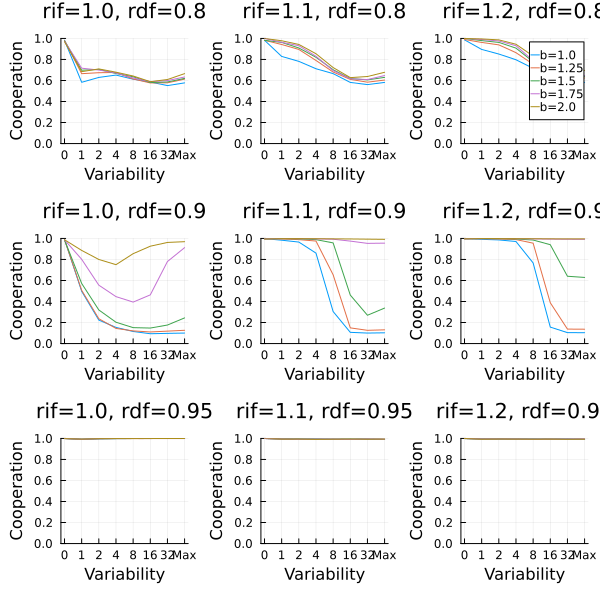

In [8]:
for C_rate₀ in sort(unique(df.C_rate₀))
    println("C_rate₀=$(C_rate₀)")
    p_vec = []

    for _df in groupby(df[df.C_rate₀ .== C_rate₀, :], [:relationship_increment_factor, :resource_decrement_factor])
        _sr = _df[1, :]
        title = "rif=$(_sr.relationship_increment_factor), rdf=$(_sr.resource_decrement_factor)"
        _df = sort(_df[:, [:b, :ev_hop, :cooperation_rate]])

        # x軸: ev_hop
        ev_hop_vec = [x == 99 ? "Max" : string(x) for x in sort(unique(_df.ev_hop))]

        p = plot(
            xticks=(1:length(ev_hop_vec), ev_hop_vec),
            ylim=(0,1),
            xlabel="Variability",
            ylabel="Cooperation",
            title=title,
        )

        for __df in groupby(_df, [:b])
            b = __df.b[1]
            __df = sort(__df[:, [:ev_hop, :cooperation_rate]])
            if length(p_vec) == 2
                plot!(__df.cooperation_rate, label="b=$(b)")
            else
                plot!(__df.cooperation_rate, label=false)
            end
        end

        push!(p_vec, p)
    end

    plot(p_vec..., layout=(3, 3), size=(600, 600)) |> display
end;

# 大区分: C_rate₀, 中区分: (b, resource_decrement_factor), 小区分: relationship_increment_factor

C_rate₀=0.0


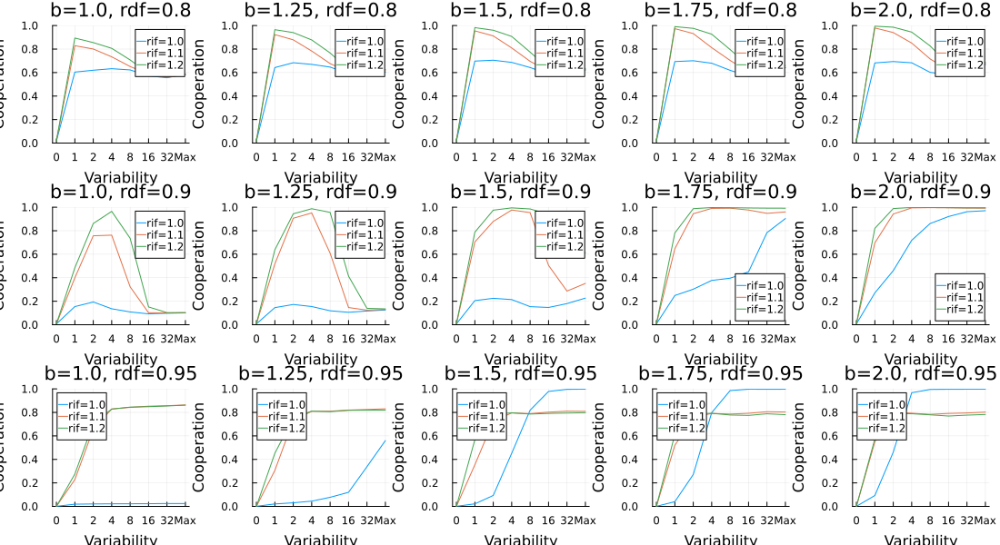

C_rate₀=0.5


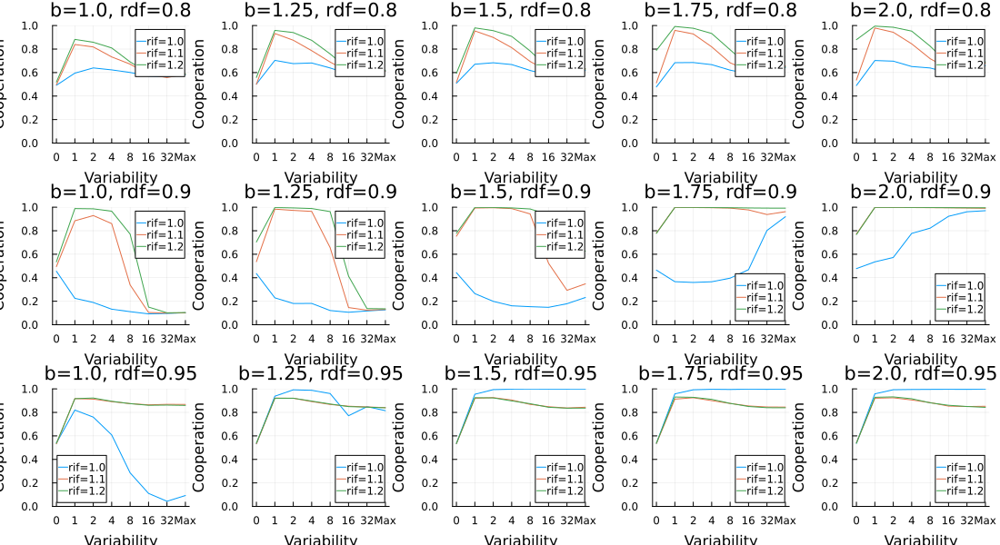

C_rate₀=1.0


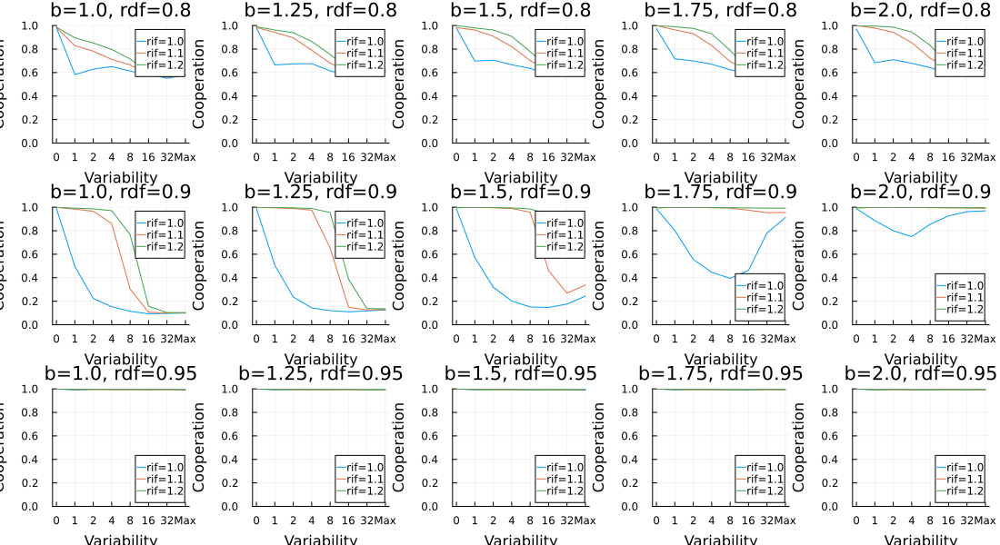

In [10]:
for C_rate₀ in sort(unique(df.C_rate₀))
    println("C_rate₀=$(C_rate₀)")
    p_vec = []

    for _df in groupby(df[df.C_rate₀ .== C_rate₀, :], [:b, :resource_decrement_factor])
        _sr = _df[1, :]
        title = "b=$(_sr.b), rdf=$(_sr.resource_decrement_factor)"
        _df = sort(_df[:, [:relationship_increment_factor, :ev_hop, :cooperation_rate]])

        # x軸: ev_hop
        ev_hop_vec = [x == 99 ? "Max" : string(x) for x in sort(unique(_df.ev_hop))]

        p = plot(
            xticks=(1:length(ev_hop_vec), ev_hop_vec),
            ylim=(0,1),
            xlabel="Variability",
            ylabel="Cooperation",
            title=title,
        )

        for __df in groupby(_df, [:relationship_increment_factor])
            rif = __df.relationship_increment_factor[1]
            __df = sort(__df[:, [:ev_hop, :cooperation_rate]])
            plot!(__df.cooperation_rate, label="rif=$(rif)")
        end

        push!(p_vec, p)
    end

    plot(p_vec..., layout=(3, 5), size=(1100, 600)) |> display
end;

# 大区分: C_rate₀, 中区分: (b, relationship_increment_factor), 小区分: resource_decrement_factor

C_rate₀=0.0


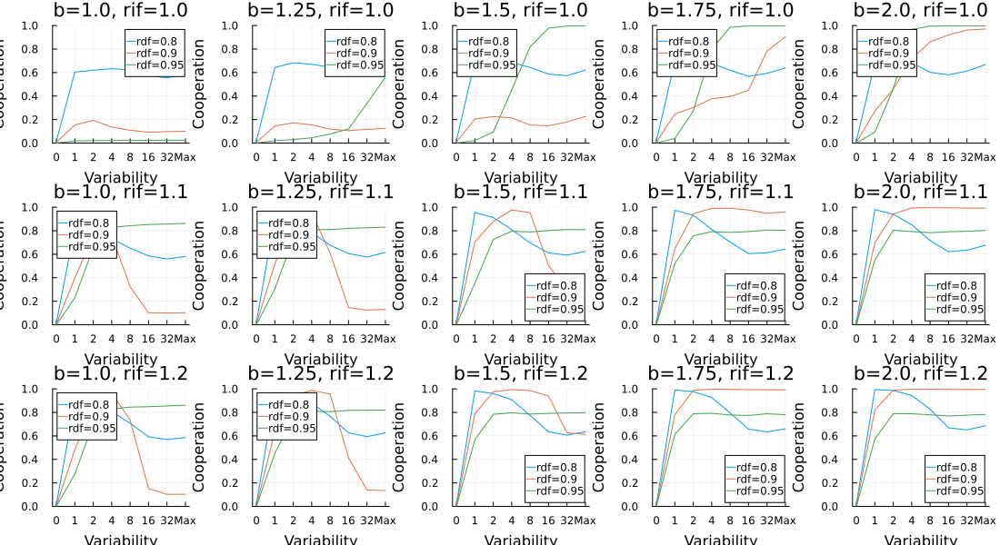

C_rate₀=0.5


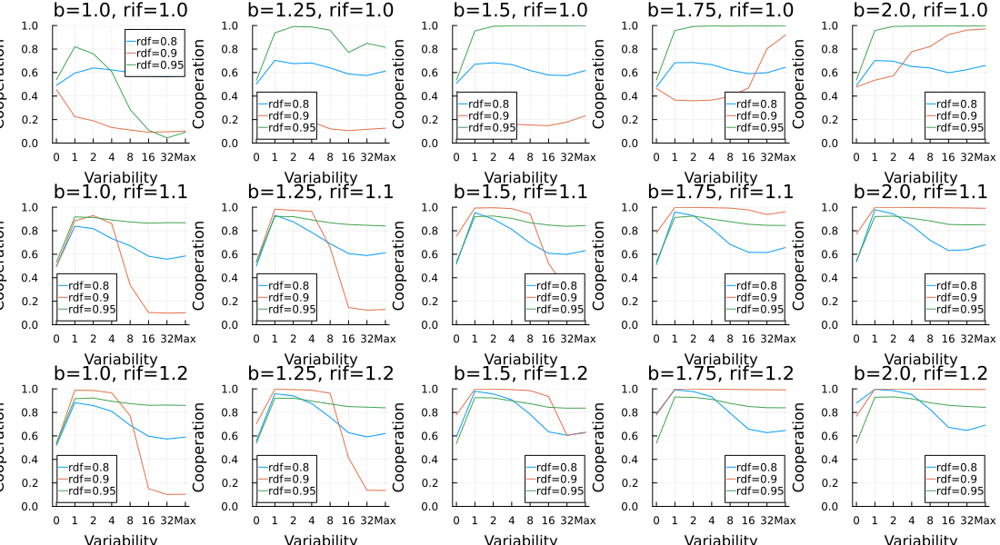

C_rate₀=1.0


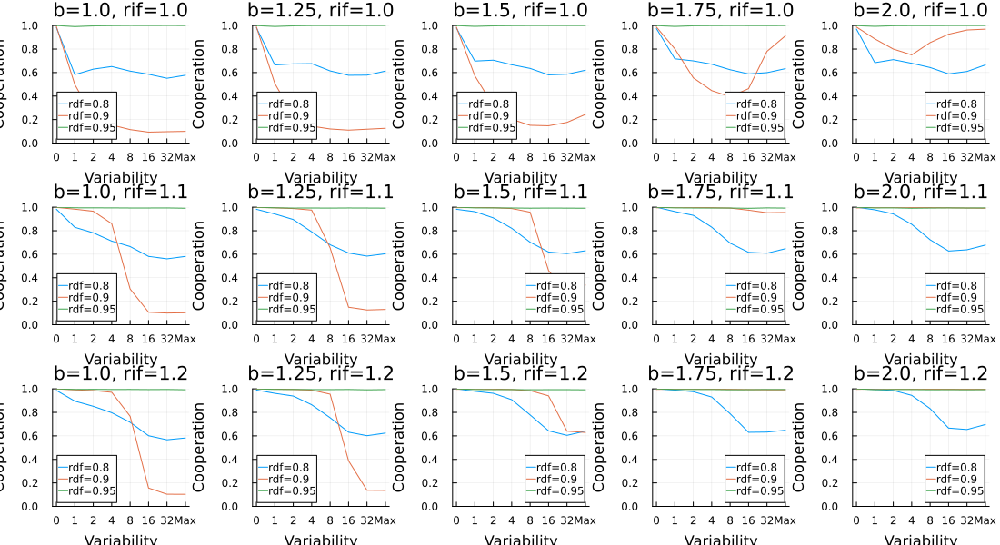

In [12]:
for C_rate₀ in sort(unique(df.C_rate₀))
    println("C_rate₀=$(C_rate₀)")
    p_vec = []

    for _df in groupby(df[df.C_rate₀ .== C_rate₀, :], [:b, :relationship_increment_factor])
        _sr = _df[1, :]
        title = "b=$(_sr.b), rif=$(_sr.relationship_increment_factor)"
        _df = sort(_df[:, [:resource_decrement_factor, :ev_hop, :cooperation_rate]])

        # x軸: ev_hop
        ev_hop_vec = [x == 99 ? "Max" : string(x) for x in sort(unique(_df.ev_hop))]

        p = plot(
            xticks=(1:length(ev_hop_vec), ev_hop_vec),
            ylim=(0,1),
            xlabel="Variability",
            ylabel="Cooperation",
            title=title,
        )

        for __df in groupby(_df, [:resource_decrement_factor])
            rdf = __df.resource_decrement_factor[1]
            __df = sort(__df[:, [:ev_hop, :cooperation_rate]])
            plot!(__df.cooperation_rate, label="rdf=$(rdf)")
        end

        push!(p_vec, p)
    end

    plot(p_vec..., layout=(3, 5), size=(1100, 600)) |> display
end;